# DETECTRON 2
https://github.com/facebookresearch/detectron2

In [24]:
#toimport torch,cv2
import matplotlib.pyplot as plt
import randomrch.cuda.get_device_name(0)

In [3]:
from detectron2.structures import BoxMode
#type(BoxMode.XYWH_ABS)

In [5]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog,DatasetCatalog

In [6]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("train", {}, "/home/appuser/detectron2_repo/data/training/train.json", "/home/appuser/detectron2_repo/data/images/")

register_coco_instances("test", {}, "/home/appuser/detectron2_repo/data/training/test.json", "/home/appuser/detectron2_repo/data/images/")



In [7]:
test_metadata = MetadataCatalog.get("test")
#test_metadata

In [8]:
train_metadata = MetadataCatalog.get("train")
#train_metadata

In [9]:
dataset_dicts = DatasetCatalog.get("train")
dataset_dicts[0]

{'file_name': '/home/appuser/detectron2_repo/data/images/image_000000001.jpg',
 'height': 768,
 'width': 1024,
 'image_id': 1,
 'annotations': [{'iscrowd': 0,
   'bbox': [845, 144, 147, 478],
   'category_id': 0,
   'segmentation': [[845, 144, 845, 622, 992, 622, 992, 144]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [847, 215, 176, 552],
   'category_id': 0,
   'segmentation': [[847, 215, 847, 767, 1023, 767, 1023, 215]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [73, 158, 76, 82],
   'category_id': 1,
   'segmentation': [[73, 158, 73, 240, 149, 240, 149, 158]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [152, 123, 659, 644],
   'category_id': 1,
   'segmentation': [[152, 123, 152, 767, 811, 767, 811, 123]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}

In [10]:
dataset_dicts = DatasetCatalog.get("test")
dataset_dicts[0]

{'file_name': '/home/appuser/detectron2_repo/data/images/image_000000003.jpg',
 'height': 683,
 'width': 1024,
 'image_id': 1,
 'annotations': [{'iscrowd': 0,
   'bbox': [7, -1, 81, 610],
   'category_id': 0,
   'segmentation': [[7, -1, 7, 609, 88, 609, 88, -1]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [56, 31, 152, 257],
   'category_id': 0,
   'segmentation': [[56, 31, 56, 288, 208, 288, 208, 31]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [166, -1, 290, 649],
   'category_id': 0,
   'segmentation': [[166, -1, 166, 648, 456, 648, 456, -1]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [329, 66, 81, 204],
   'category_id': 0,
   'segmentation': [[329, 66, 329, 270, 410, 270, 410, 66]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd': 0,
   'bbox': [365, 150, 268, 341],
   'category_id': 0,
   'segmentation': [[365, 150, 365, 491, 633, 491, 633, 150]],
   'bbox_mode': <BoxMode.XYWH_ABS: 1>},
  {'iscrowd':

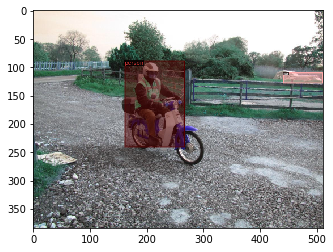

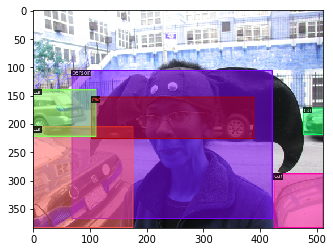

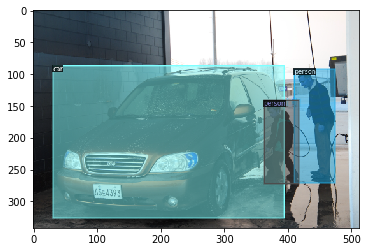

In [15]:
dataset_dicts = DatasetCatalog.get("train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    image_show = plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

In [16]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [17]:
from detectron2.engine import DefaultTrainer
import os
classes = 2
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = classes
cfg.INPUT.MIN_SIZE_TRAIN=(640, 672, 704, 736, 768, 800,832, 864, 896, 928, 960, 992, 1024)
cfg.INPUT.MIN_SIZE_TEST=640
cfg.INPUT.MAX_SIZE_TEST=1024
cfg.INPUT.MAX_SIZE_TRAIN=1024
cfg.DATALOADER.NUM_WORKERS = 4
cfg.LOAD_TRUNCATED_IMAGES = True
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo

# RoI minibatch size *per image* (number of regions of interest [ROIs])
# Total number of RoIs per training minibatch =
#   ROI_HEADS.BATCH_SIZE_PER_IMAGE * SOLVER.IMS_PER_BATCH
# E.g., a common configuration is: 512 * 2 = 1024
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = classes

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001  #LR
cfg.SOLVER.MAX_ITER = 2500 

cfg.SOLVER.WARMUP_ITERS = 1000  # warmup steps
cfg.SOLVER.GAMMA = 0.03
# The iteration number to decrease learning rate by GAMMA.
cfg.SOLVER.STEPS = (1000,)# training will sstart from 1000->2500 ~  1500 ITER with 0.001 LR



cfg.TEST.EVAL_PERIOD = 1000
cfg.OUTPUT_DIR = "/home/appuser/detectron2_repo/data/training/detectron"




In [18]:
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/16 07:08:15 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:54, 7.72MB/s]                               
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (3, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (3,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (8, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (8,) in the model! Skipped.


[01/16 07:09:12 d2.engine.train_loop]: Starting training from iteration 0
[01/16 07:09:24 d2.utils.events]: eta: 0:22:56  iter: 19  total_loss: 1.732  loss_cls: 1.191  loss_box_reg: 0.456  loss_rpn_cls: 0.038  loss_rpn_loc: 0.039  time: 0.5431  data_time: 0.0494  lr: 0.000020  max_mem: 4901M
[01/16 07:09:35 d2.utils.events]: eta: 0:22:39  iter: 39  total_loss: 1.613  loss_cls: 0.966  loss_box_reg: 0.495  loss_rpn_cls: 0.043  loss_rpn_loc: 0.040  time: 0.5484  data_time: 0.0167  lr: 0.000040  max_mem: 6123M
[01/16 07:09:46 d2.utils.events]: eta: 0:22:08  iter: 59  total_loss: 1.266  loss_cls: 0.660  loss_box_reg: 0.509  loss_rpn_cls: 0.056  loss_rpn_loc: 0.042  time: 0.5429  data_time: 0.0145  lr: 0.000060  max_mem: 6123M
[01/16 07:09:57 d2.utils.events]: eta: 0:21:58  iter: 79  total_loss: 1.082  loss_cls: 0.496  loss_box_reg: 0.522  loss_rpn_cls: 0.025  loss_rpn_loc: 0.027  time: 0.5462  data_time: 0.0159  lr: 0.000080  max_mem: 6123M
[01/16 07:10:08 d2.utils.events]: eta: 0:21:41  it

OrderedDict([('bbox',
              {'AP': 43.75956493131945,
               'AP50': 74.18365070957623,
               'AP75': 45.75322047500637,
               'APs': 8.452843292572036,
               'APm': 35.90015880806224,
               'APl': 56.22895099947268,
               'AP-person': 38.593556651271186,
               'AP-car': 48.92557321136772})])

In [21]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set the testing threshold for this model
cfg.DATASETS.TEST = ("test", )
predictor = DefaultPredictor(cfg)

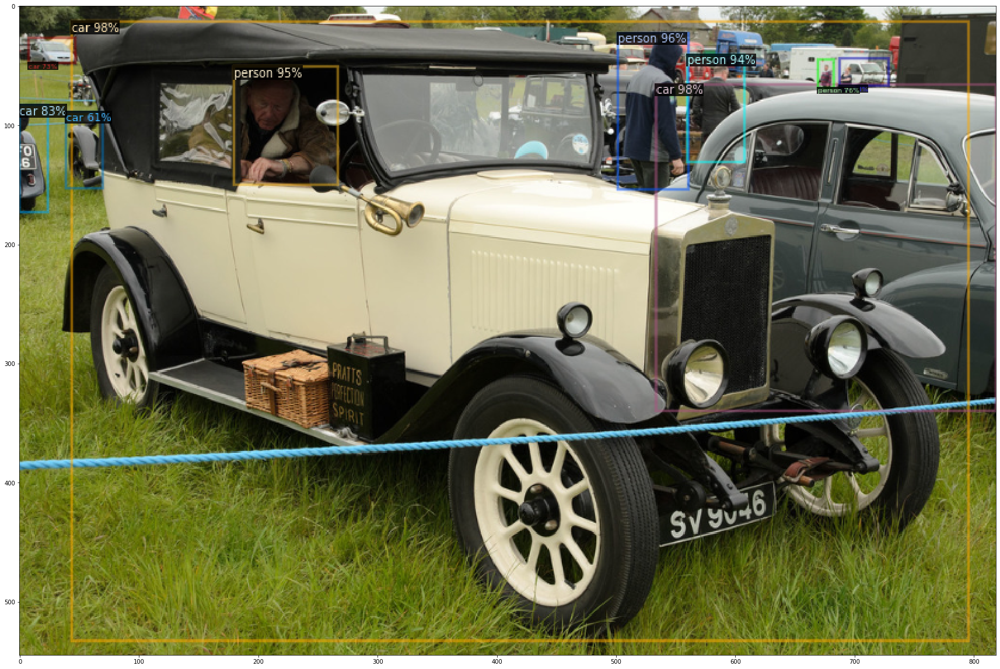

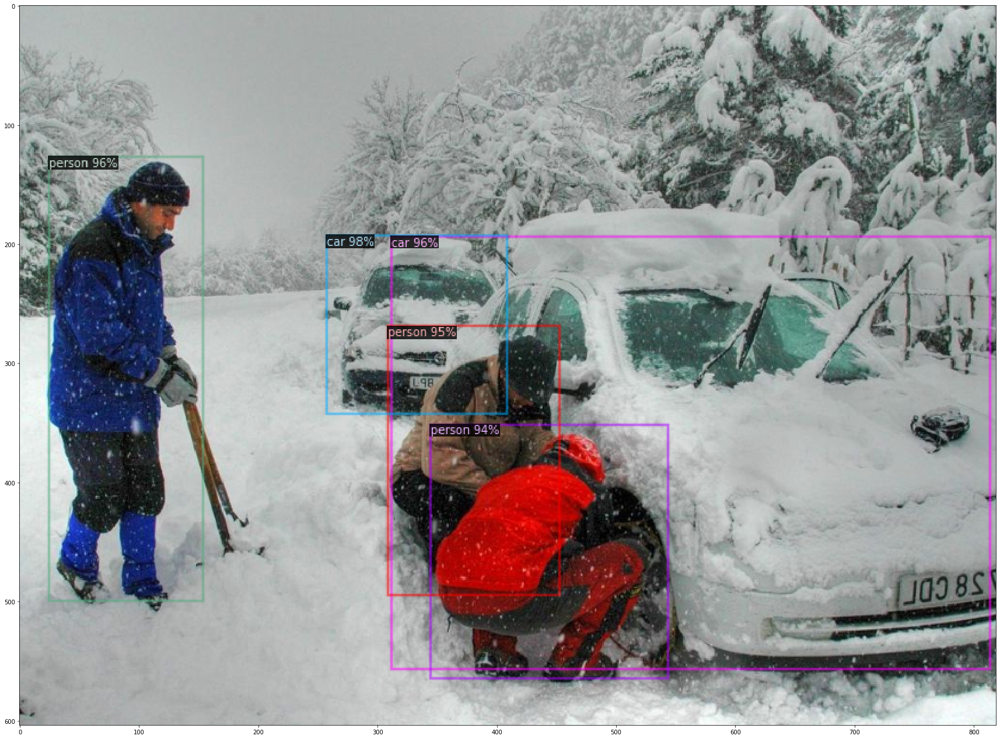

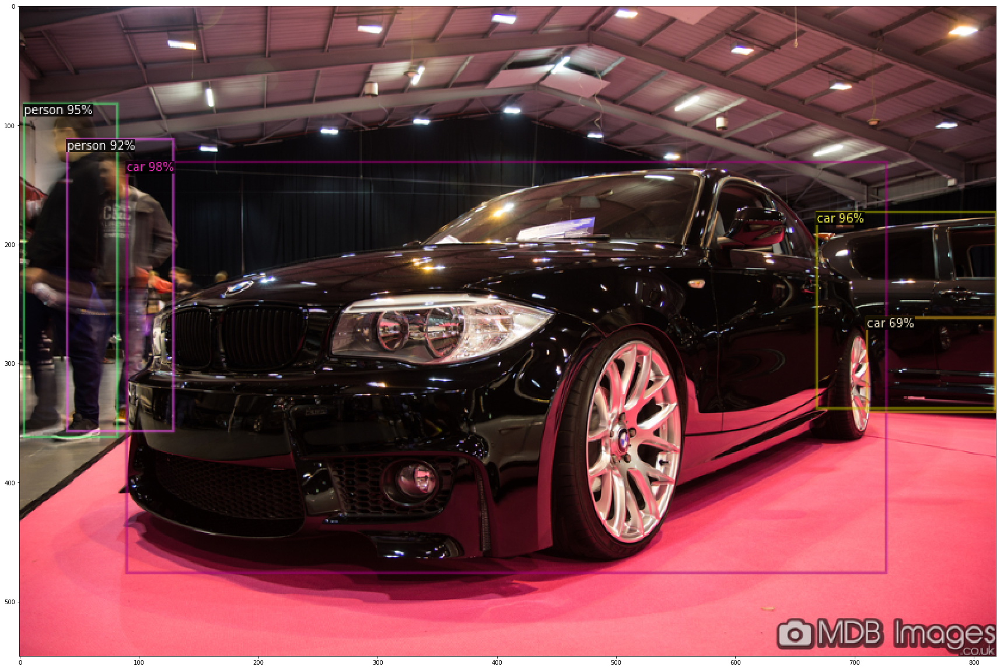

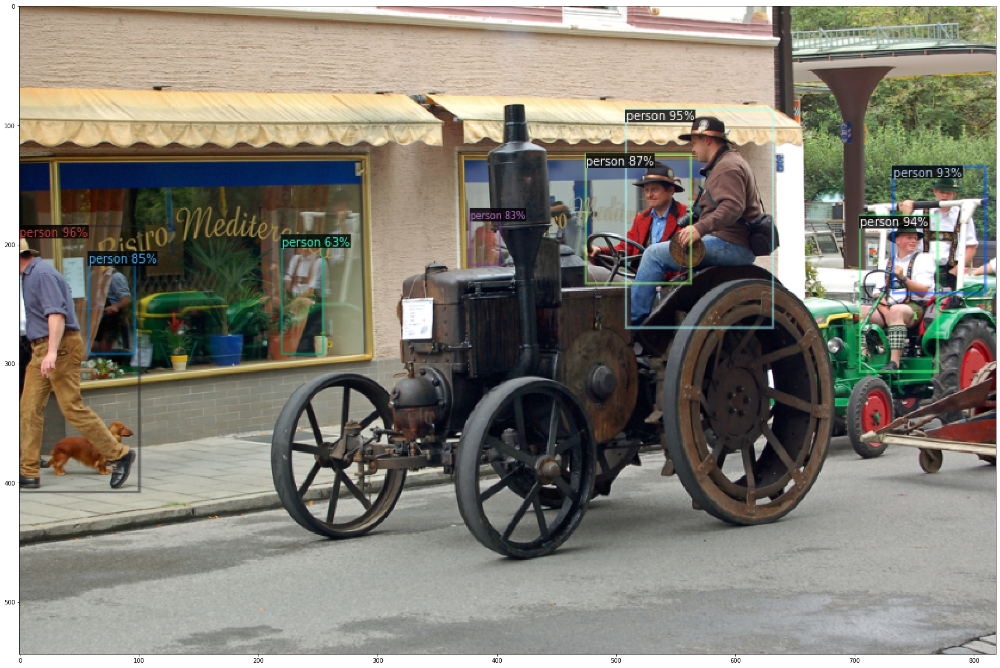

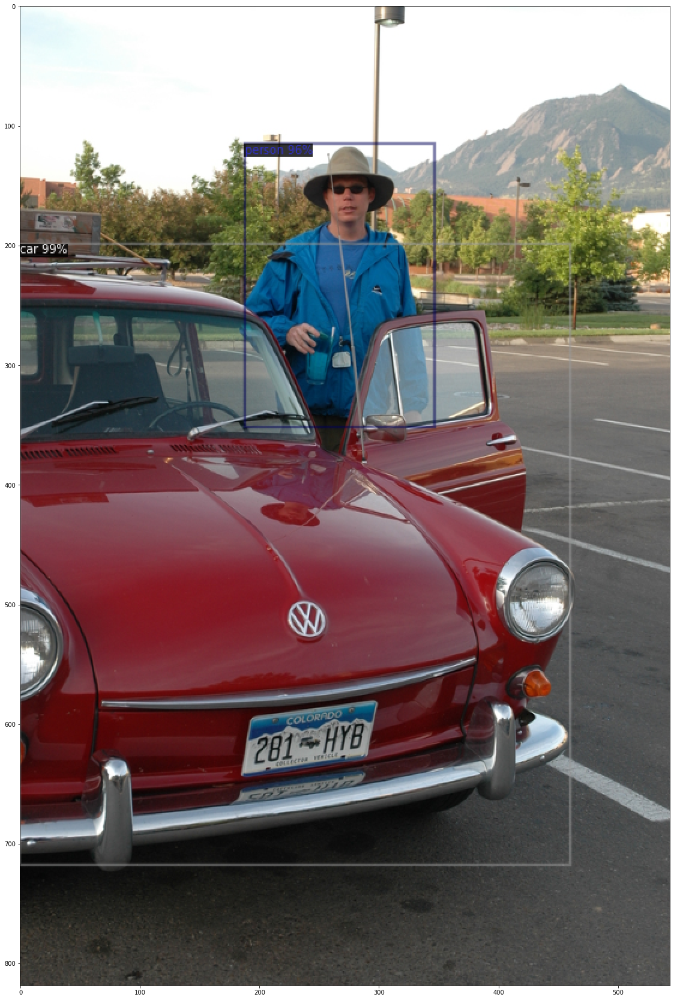

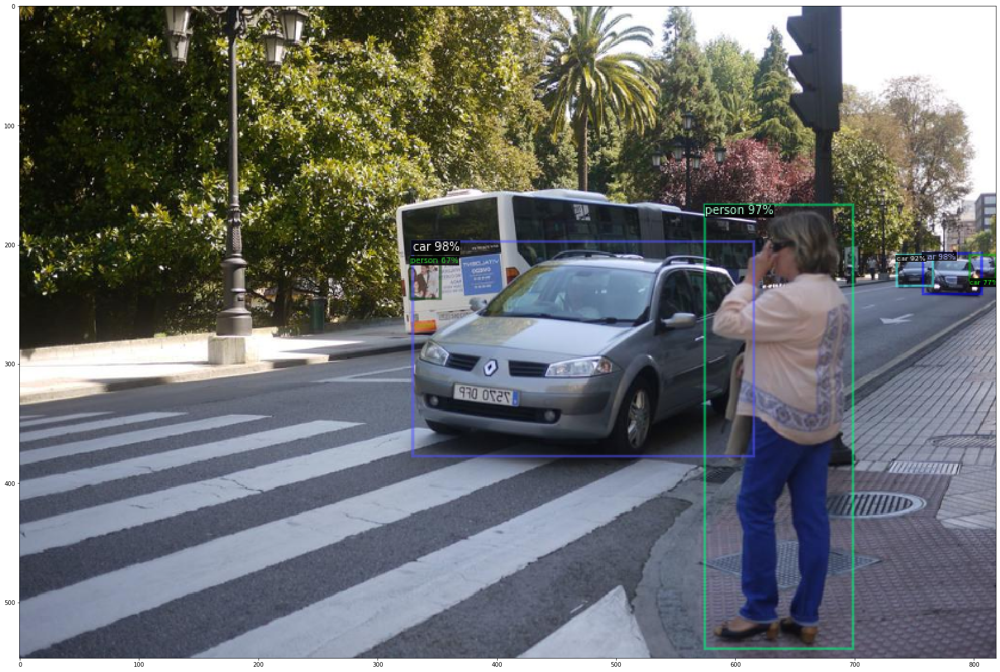

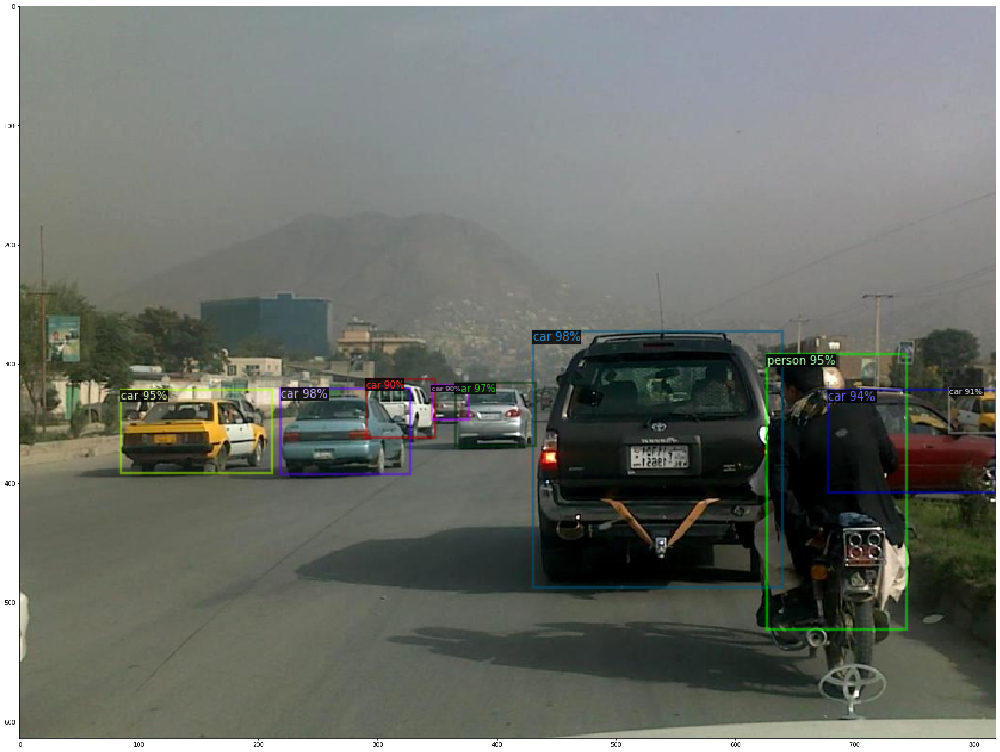

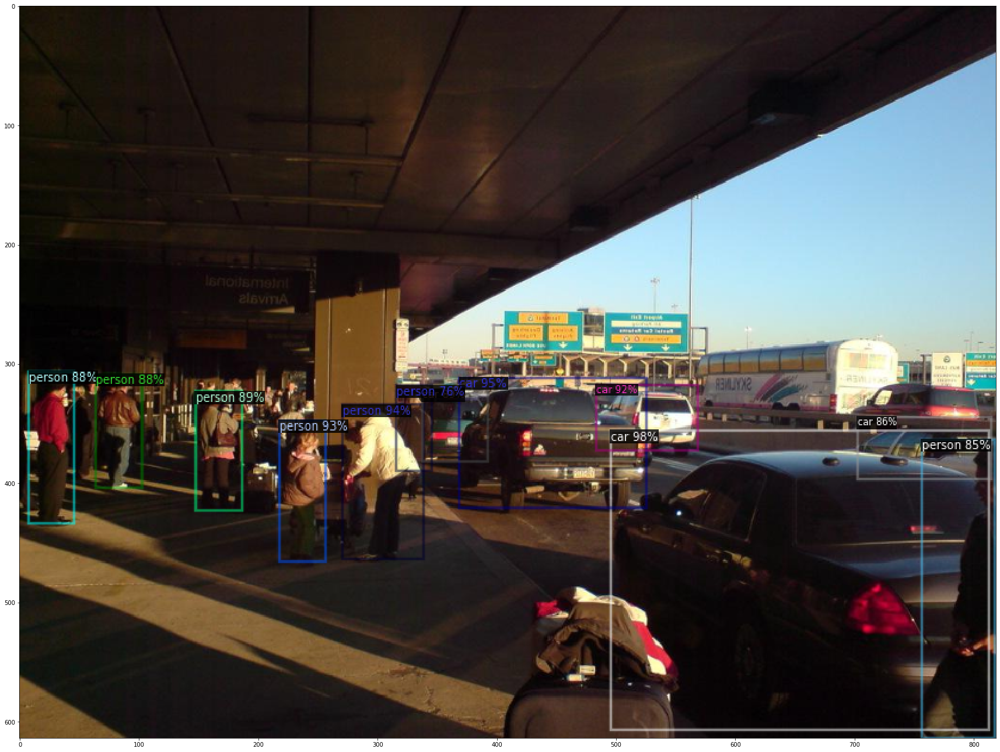

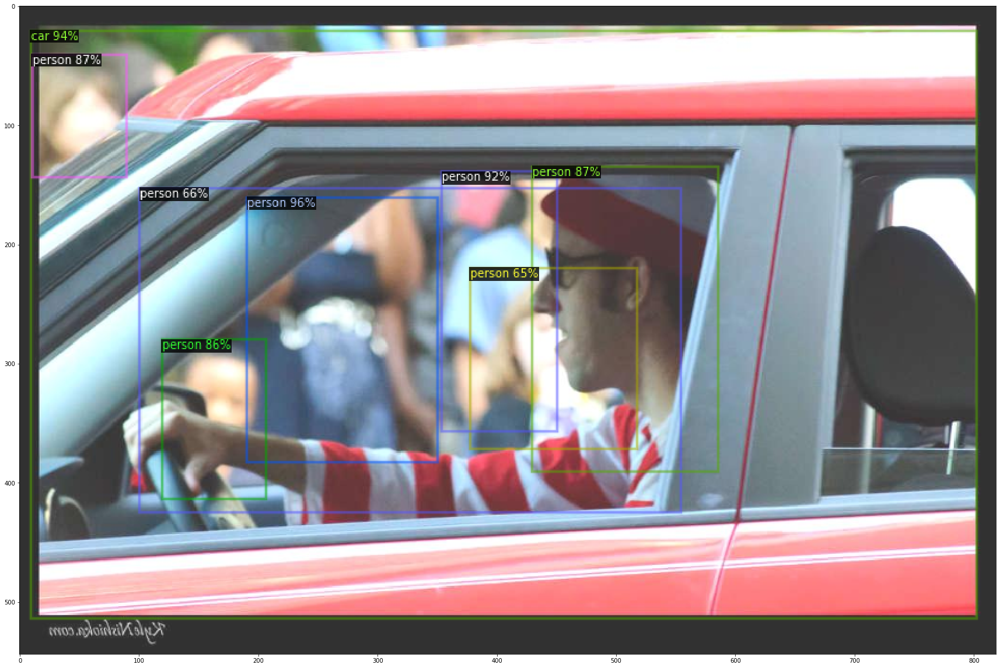

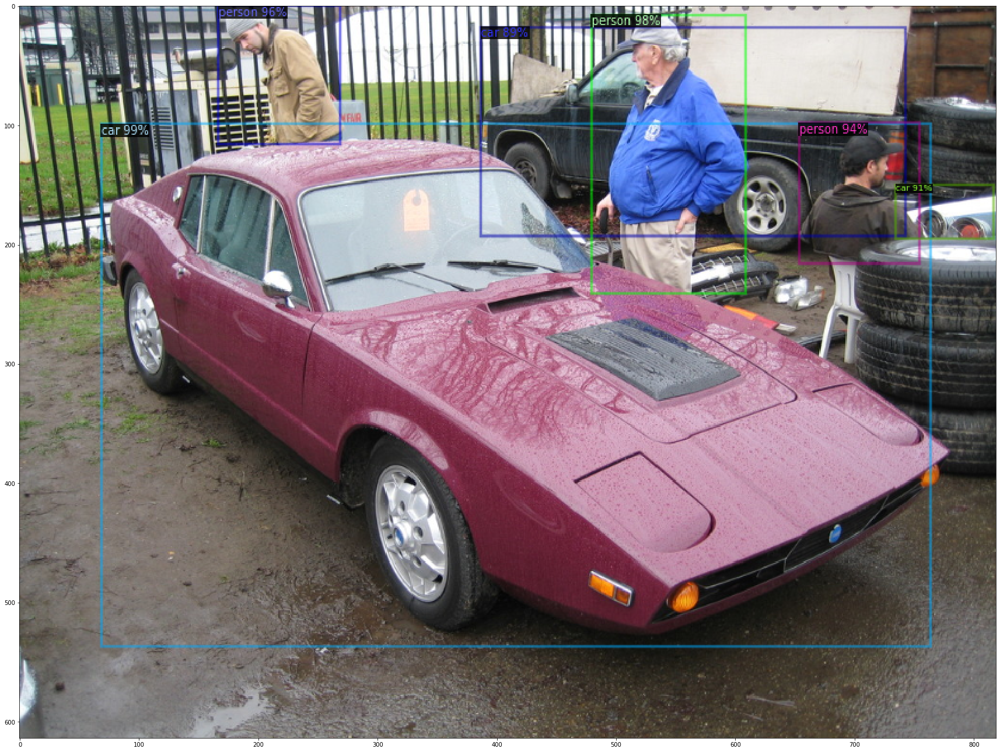

In [22]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt
%matplotlib inline
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata, 
                   scale=0.8  # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=(30, 30))
    plt.imshow(v.get_image(),cmap='gray',interpolation='none')
    plt.show()


#cv2.imshow(v.get_image()[:, :, ::-1])

In [23]:
%load_ext tensorboard
%tensorboard --logdir output 

'AP50': 74.18

##### 